# 🎯 Детектирование лиц: HAAR-cascades vs MTCNN vs InsightFace
## PyTorch-нативный блокнот (без TensorFlow)

На этом практическом занятии мы сравним 3 метода детектирования лиц:
1. **HAAR-cascades** (классика OpenCV) - очень быстрый, но неточный
2. **MTCNN** (PyTorch) - баланс скорости и качества  
3. **InsightFace** (ONNX Runtime) - state-of-the-art, полностью на PyTorch

**Почему InsightFace вместо RetinaFace?**
- ✅ Не требует TensorFlow
- ✅ Работает на PyTorch/ONNX
- ✅ Автоматическая загрузка предобученных моделей
- ✅ Поддержка GPU через onnxruntime

## 📦 Установка библиотек

In [2]:
# Установка необходимых библиотек
#!pip install opencv-python facenet-pytorch insightface onnxruntime-gpu matplotlib
# Для CPU: pip install onnxruntime

In [1]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
import os
from tqdm.notebook import tqdm
import time
from facenet_pytorch import MTCNN
import insightface

#%matplotlib inline

## 📸 Подготовка тестовых изображений

In [4]:
# # Создаем папку для тестовых изображений
# os.makedirs('test_images', exist_ok=True)

# # Функция для загрузки изображения по URL
# def download_image(url, filename):
#     if not os.path.exists(filename):
#         urllib.request.urlretrieve(url, filename)
#         print(f"✅ Загружено: {filename}")
#     else:
#         print(f"✓ Файл уже существует: {filename}")

# # Загружаем тестовые изображения
# test_images = {
#     'group1': 'file:./test_images/beg_s_udovolstviem.jpg',
#     'group2': 'file:./test_images/CEV-FinalFourW_20120325-180633.jpg',
#     'group3': 'file:./test_images/RUDN_fizmat'
# }

# for fname, url in test_images.items():
#     download_image(url, f'test_images/{fname}')

print(f"\n📂 Готово! Изображения в папке 'test_images/'")


📂 Готово! Изображения в папке 'test_images/'


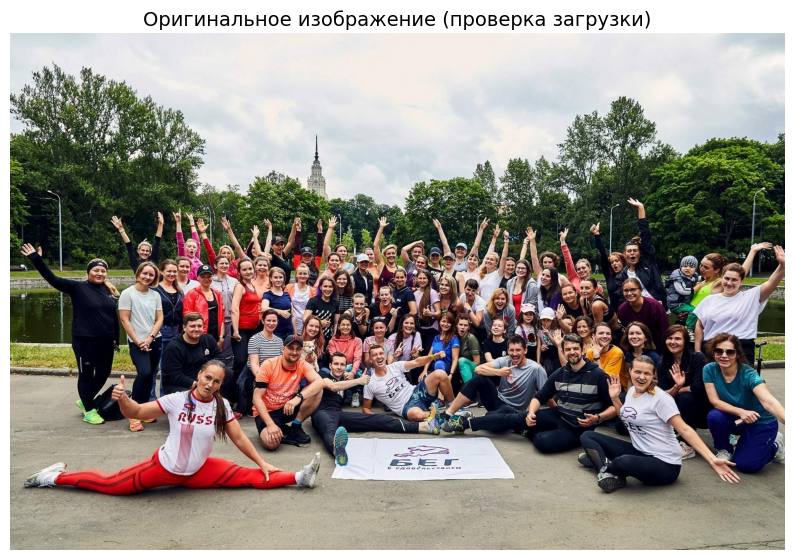

In [5]:
# Функция для отображения изображений
def show_image(img_path, title="", figsize=(10, 8)):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title, fontsize=14)
    plt.axis('off')
    plt.show()

# Показываем одно изображение
show_image('test_images/group1.jpg', 'Оригинальное изображение (проверка загрузки)')

## 1️⃣ Метод 1: HAAR-cascades (OpenCV)
**Классический метод, основанный на каскадах Хаара**
- ✅ Очень быстрый, не требует GPU
- ❌ Низкая точность, много ложных срабатываний

In [6]:
print("⬇️ Загружаем HAAR-cascade...")
haar_cascade_path = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
haar_detector = cv2.CascadeClassifier(haar_cascade_path)
print("✅ Каскад загружен!")

⬇️ Загружаем HAAR-cascade...
✅ Каскад загружен!


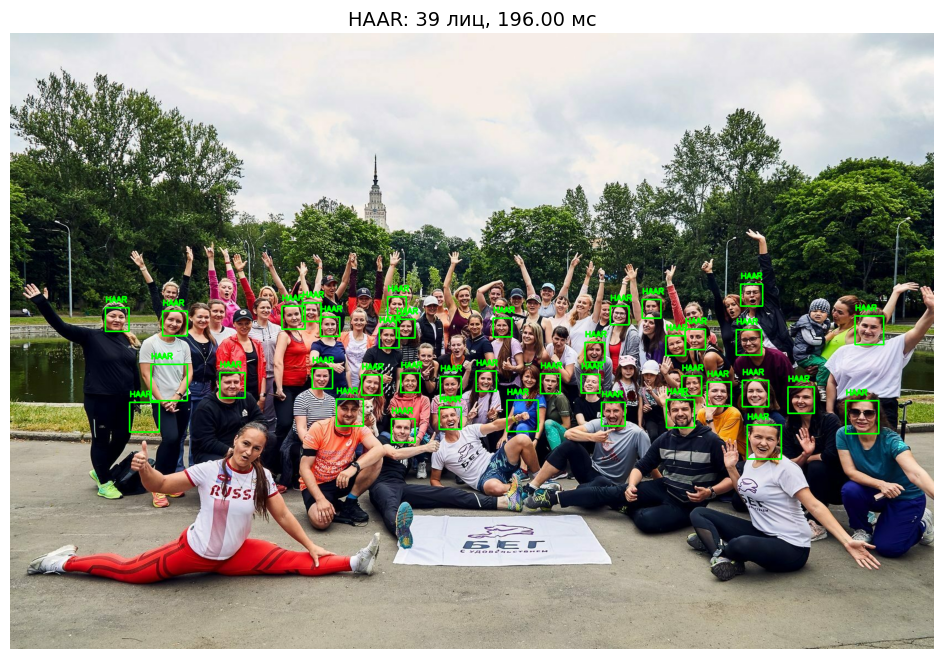

In [10]:
def detect_faces_haar(image_path):
    """Детектирование лиц с помощью HAAR-cascades"""
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    start_time = time.time()
    faces = haar_detector.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30, 30)
    )
    elapsed_time = time.time() - start_time
    
    img_with_boxes = img.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(img_with_boxes, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(img_with_boxes, 'HAAR', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    return img_with_boxes, faces, elapsed_time

def show_image_array(img_array, title):
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=14)
    plt.axis('off')
    plt.show()

# Тестируем
result_haar, faces_haar, time_haar = detect_faces_haar('test_images/group1.jpg')
show_image_array(result_haar, f'HAAR: {len(faces_haar)} лиц, {time_haar*1000:.2f} мс')

## 2️⃣ Метод 2: MTCNN (Multi-task Cascaded Convolutional Networks)
**Современная нейросетевая модель на PyTorch**
- ✅ Высокая точность, находит ключевые точки
- ⚡ Средняя скорость, PyTorch-нативный

In [12]:
print("⬇️ Загружаем MTCNN...")
device = "cpu"
mtcnn_detector = MTCNN(
    image_size=160,
    margin=0,
    min_face_size=20,
    thresholds=[0.6, 0.7, 0.7],
    factor=0.709,
    post_process=True,
    device=device
)
print(f"✅ MTCNN загружен на {device}")

⬇️ Загружаем MTCNN...
✅ MTCNN загружен на cpu


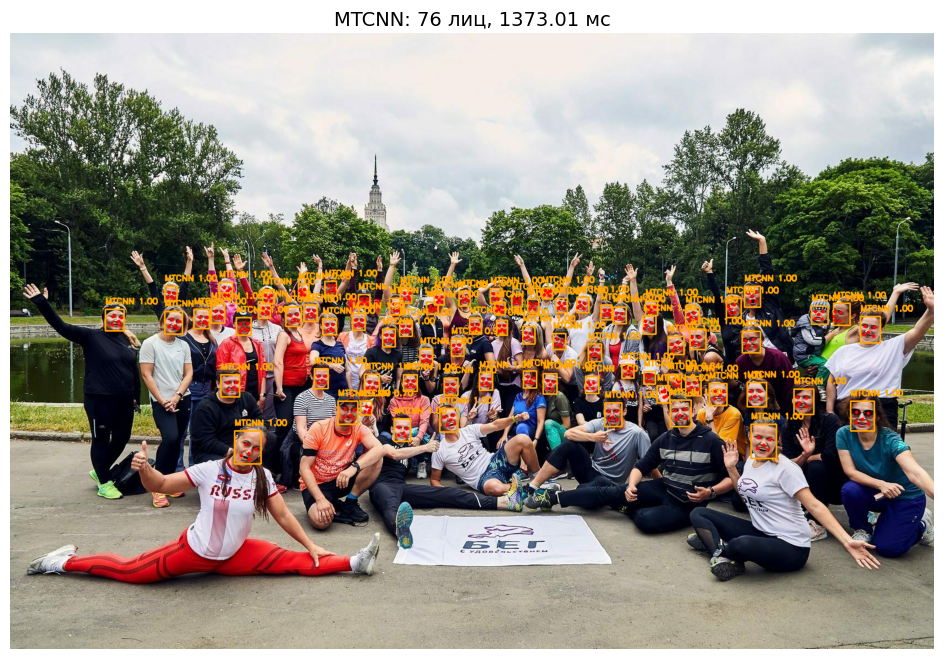

In [14]:
def detect_faces_mtcnn(image_path):
    """Детектирование лиц с помощью MTCNN"""
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    start_time = time.time()
    boxes, probs, landmarks = mtcnn_detector.detect(img_rgb, landmarks=True)
    elapsed_time = time.time() - start_time
    
    img_with_boxes = img.copy()
    if boxes is not None:
        for i, (box, prob, landmark) in enumerate(zip(boxes, probs, landmarks)):
            x1, y1, x2, y2 = [int(coord) for coord in box]
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (0, 165, 255), 2)
            cv2.putText(img_with_boxes, f'MTCNN {prob:.2f}', (x1, y1-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 165, 255), 2)
            
            for point in landmark:
                cv2.circle(img_with_boxes, (int(point[0]), int(point[1])), 3, (0, 0, 255), -1)
    
    num_faces = len(boxes) if boxes is not None else 0
    return img_with_boxes, boxes, elapsed_time

# Тестируем
result_mtcnn, faces_mtcnn, time_mtcnn = detect_faces_mtcnn('test_images/group1.jpg')
show_image_array(result_mtcnn, f'MTCNN: {len(faces_mtcnn) if faces_mtcnn is not None else 0} лиц, {time_mtcnn*1000:.2f} мс')

## 3️⃣ Метод 3: InsightFace (ArcFace)
**Современный SOTA-метод на ONNX/PyTorch**
- ✅ Самая высокая точность
- ✅ Без TensorFlow, на ONNX Runtime
- ✅ Автоматическая загрузка моделей

### 📥 Установка и загрузка модели InsightFace
Модель скачивается автоматически при первом вызове!

In [20]:
print("⬇️ Загружаем InsightFace...")
print("📦 Модель скачается автоматически при первом запуске (~40MB)")

# Создаем приложение для анализа лиц
insightface_app = insightface.app.FaceAnalysis()
#insightface_app.prepare(ctx_id=0 if torch.cuda.is_available() else -1, det_size=(640, 640))
insightface_app.prepare(ctx_id=-1, det_size=(640, 640))

print(f"✅ InsightFace загружен!")
# print(f"📍 Устройство: {'GPU' if torch.cuda.is_available() else 'CPU'}")

⬇️ Загружаем InsightFace...
📦 Модель скачается автоматически при первом запуске (~40MB)
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Iakov/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Iakov/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Iakov/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\Iakov/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\I

🎯 Тестируем InsightFace:


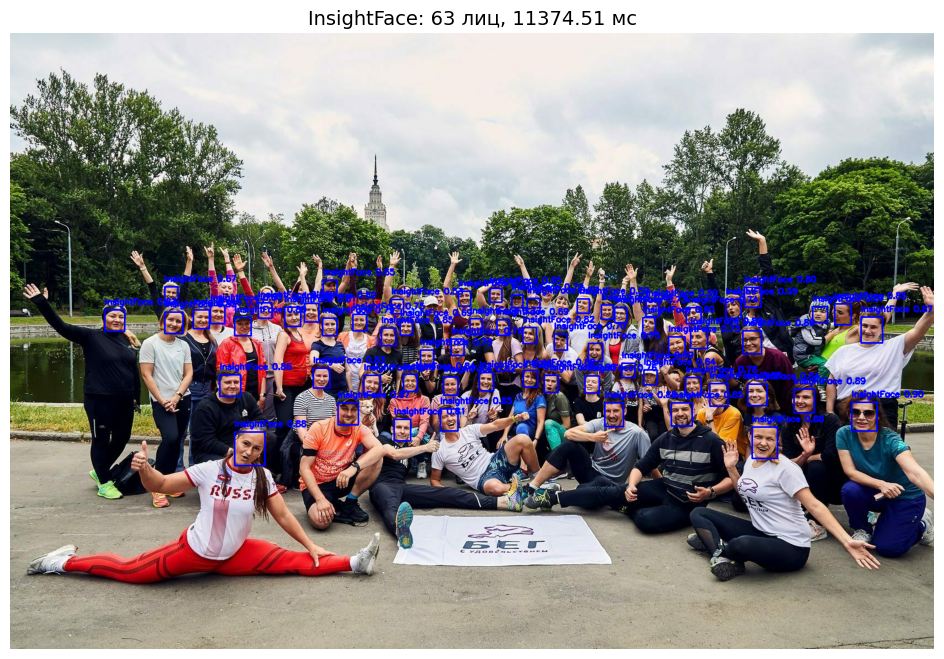

In [21]:
def detect_faces_insightface(image_path):
    """Детектирование лиц с помощью InsightFace"""
    # Загружаем изображение
    img = cv2.imread(image_path)
    
    # Детектирование
    start_time = time.time()
    faces = insightface_app.get(img)
    elapsed_time = time.time() - start_time
    
    # Рисуем bounding boxes и landmarks
    img_with_boxes = img.copy()
    
    for idx, face in enumerate(faces):
        # Bounding box
        bbox = face.bbox.astype(int)
        cv2.rectangle(img_with_boxes, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (255, 0, 0), 2)
        
        # Confidence score
        score = face.det_score
        cv2.putText(img_with_boxes, f'InsightFace {score:.2f}', (bbox[0], bbox[1]-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
#         # Landmarks (5 точек: глаза, нос, рот)
#         print(f"{face.landmark=}")
#         landmarks = face.landmark.astype(int)
#         for point in landmarks:
#             cv2.circle(img_with_boxes, (point[0], point[1]), 3, (0, 0, 255), -1)
    
    return img_with_boxes, faces, elapsed_time

# Тестируем
print("🎯 Тестируем InsightFace:")
result_insight, faces_insight, time_insight = detect_faces_insightface('test_images/group1.jpg')

show_image_array(result_insight, f'InsightFace: {len(faces_insight)} лиц, {time_insight*1000:.2f} мс')

## 📊 Сравнение всех методов


🖼️ Обрабатываем: beg_s_udovolstviem.jpg


C:\Users\Iakov\AppData\Local\Temp\ipykernel_7180\263825127.py:43: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


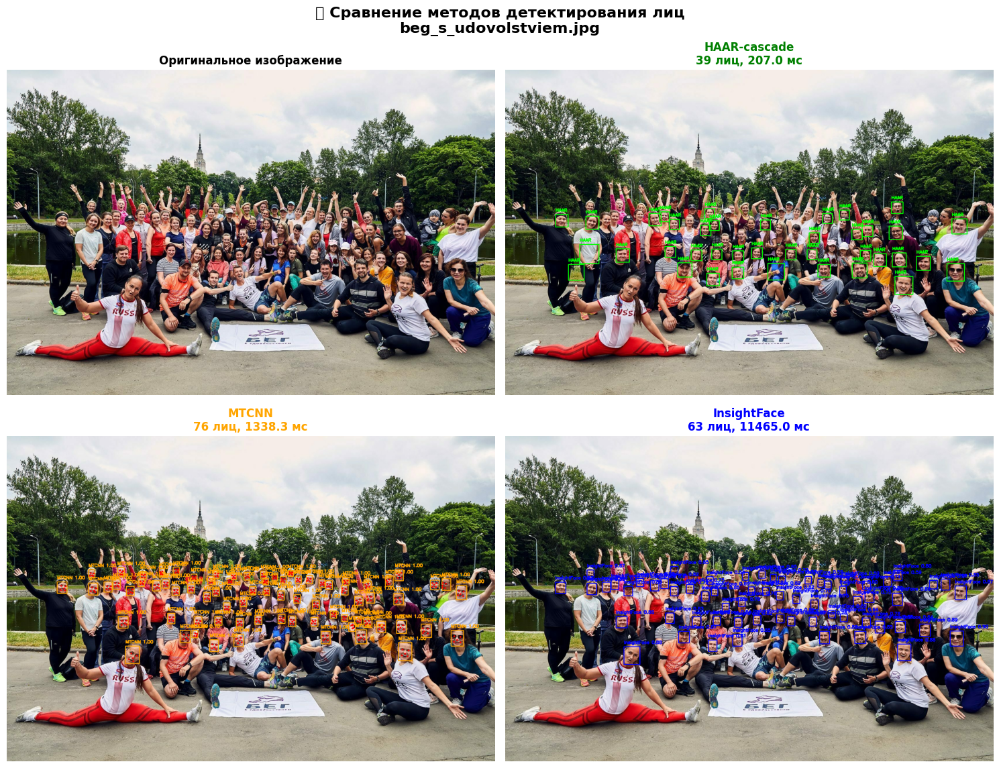

Метод           | Лиц    | Время (мс)   | FPS     
HAAR-cascade    | 39     | 207.00       | 4.8     
MTCNN           | 76     | 1338.25      | 0.7     
InsightFace     | 63     | 11465.02     | 0.1     

🖼️ Обрабатываем: CEV-FinalFourW_20120325-180633.jpg


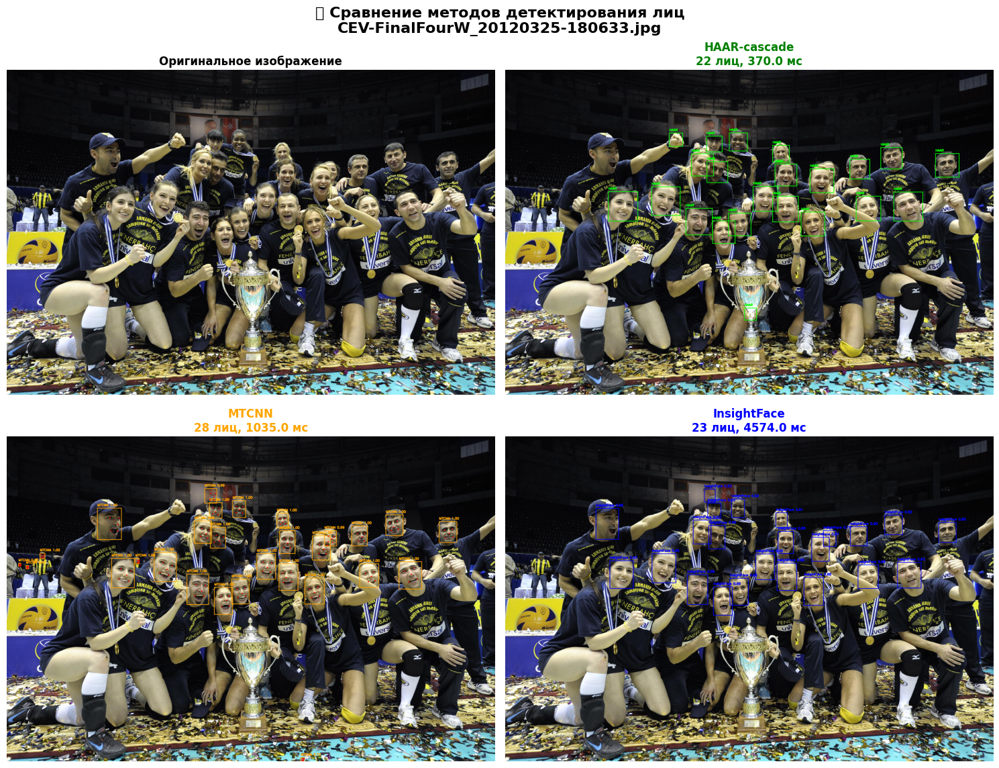

Метод           | Лиц    | Время (мс)   | FPS     
HAAR-cascade    | 22     | 370.00       | 2.7     
MTCNN           | 28     | 1035.00      | 1.0     
InsightFace     | 23     | 4574.00      | 0.2     

🖼️ Обрабатываем: group1.jpg


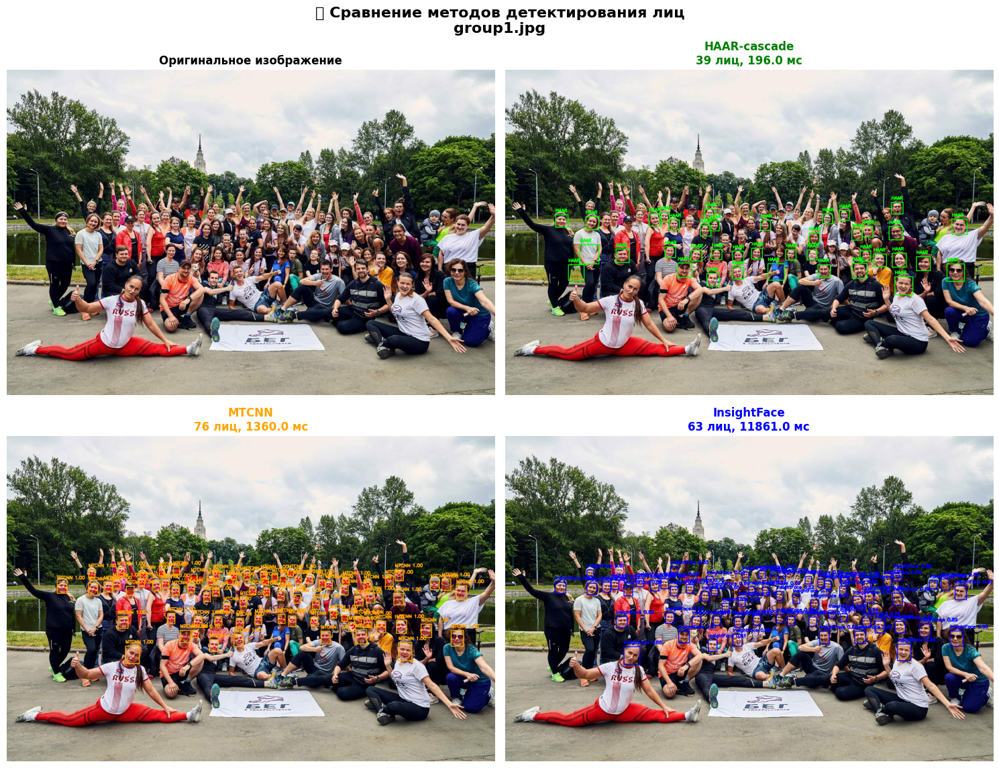

Метод           | Лиц    | Время (мс)   | FPS     
HAAR-cascade    | 39     | 196.00       | 5.1     
MTCNN           | 76     | 1360.00      | 0.7     
InsightFace     | 63     | 11861.00     | 0.1     

🖼️ Обрабатываем: RUDN_fizmat.jpg


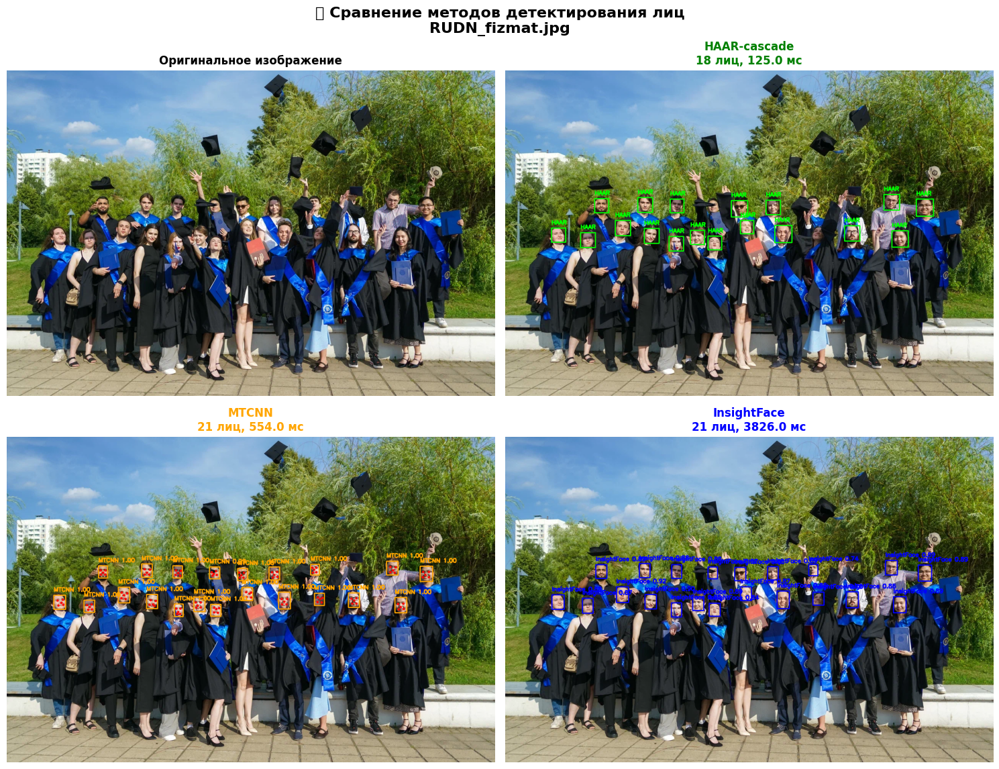

Метод           | Лиц    | Время (мс)   | FPS     
HAAR-cascade    | 18     | 124.99       | 8.0     
MTCNN           | 21     | 554.00       | 1.8     
InsightFace     | 21     | 3826.00      | 0.3     


In [22]:
def compare_all_methods(image_path):
    """Сравнение трех методов на одном изображении"""
    
    # Запускаем все методы
    result_haar, faces_haar, time_haar = detect_faces_haar(image_path)
    result_mtcnn, faces_mtcnn, time_mtcnn = detect_faces_mtcnn(image_path)
    result_insight, faces_insight, time_insight = detect_faces_insightface(image_path)
    
    # Подсчитываем количество лиц
    count_haar = len(faces_haar)
    count_mtcnn = len(faces_mtcnn) if faces_mtcnn is not None else 0
    count_insight = len(faces_insight)
    
    # Визуализация
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Оригинал
    orig_img = cv2.imread(image_path)
    axes[0, 0].imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Оригинальное изображение', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # HAAR
    axes[0, 1].imshow(cv2.cvtColor(result_haar, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title(f'HAAR-cascade\n{count_haar} лиц, {time_haar*1000:.1f} мс', 
                        fontsize=12, color='green', fontweight='bold')
    axes[0, 1].axis('off')
    
    # MTCNN
    axes[1, 0].imshow(cv2.cvtColor(result_mtcnn, cv2.COLOR_BGR2RGB))
    axes[1, 0].set_title(f'MTCNN\n{count_mtcnn} лиц, {time_mtcnn*1000:.1f} мс', 
                        fontsize=12, color='orange', fontweight='bold')
    axes[1, 0].axis('off')
    
    # InsightFace
    axes[1, 1].imshow(cv2.cvtColor(result_insight, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title(f'InsightFace\n{count_insight} лиц, {time_insight*1000:.1f} мс', 
                        fontsize=12, color='blue', fontweight='bold')
    axes[1, 1].axis('off')
    
    plt.suptitle(f'📊 Сравнение методов детектирования лиц\n{os.path.basename(image_path)}', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Таблица результатов
    print(f"{'='*60}")
    print(f"{'Метод':<15} | {'Лиц':<6} | {'Время (мс)':<12} | {'FPS':<8}")
    print(f"{'='*60}")
    print(f"{'HAAR-cascade':<15} | {count_haar:<6} | {time_haar*1000:<12.2f} | {1/time_haar:<8.1f}")
    print(f"{'MTCNN':<15} | {count_mtcnn:<6} | {time_mtcnn*1000:<12.2f} | {1/time_mtcnn:<8.1f}")
    print(f"{'InsightFace':<15} | {count_insight:<6} | {time_insight*1000:<12.2f} | {1/time_insight:<8.1f}")
    print(f"{'='*60}")

# Сравниваем на всех изображениях
for img_file in os.listdir('test_images'):
    if img_file.endswith(('.jpg', '.png')):
        print(f"\n{'='*60}")
        print(f"🖼️ Обрабатываем: {img_file}")
        compare_all_methods(f'test_images/{img_file}')

## 🎬 Часть 2: Обработка видео в реальном времени

In [ ]:
def process_video(video_path=None, method='insightface', output_path='output_video.mp4'):
    """
    Обработка видео с детектированием лиц
    video_path: None для вебкамеры, или путь к файлу
    method: 'haar', 'mtcnn', 'insightface'
    """
    # Открываем видео
    if video_path is None:
        cap = cv2.VideoCapture(0)
        print(f"📹 Запускаем вебкамеру с методом {method.upper()}")
    else:
        cap = cv2.VideoCapture(video_path)
        print(f"🎬 Обрабатываем видео: {video_path}")
    
    # Параметры для записи
    if video_path is not None:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    fps_counter = 0
    start_time = time.time()
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Обработка в зависимости от метода
            if method == 'haar':
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                faces = haar_detector.detectMultiScale(gray, 1.1, 5)
                for (x, y, w, h) in faces:
                    cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
                    cv2.putText(frame, 'HAAR', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
            
            elif method == 'mtcnn':
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                boxes, probs = mtcnn_detector.detect(frame_rgb)
                if boxes is not None:
                    for box, prob in zip(boxes, probs):
                        x1, y1, x2, y2 = [int(coord) for coord in box]
                        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 165, 255), 2)
                        cv2.putText(frame, f'MTCNN {prob:.2f}', (x1, y1-10), 
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 165, 255), 2)
            
            elif method == 'insightface':
                # InsightFace работает напрямую с BGR
                faces = insightface_app.get(frame)
                for face in faces:
                    bbox = face.bbox.astype(int)
                    score = face.det_score
                    cv2.rectangle(frame, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (255, 0, 0), 2)
                    cv2.putText(frame, f'InsightFace {score:.2f}', (bbox[0], bbox[1]-10), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
            
            # Отображаем FPS
            fps_counter += 1
            if fps_counter % 10 == 0:
                fps = fps_counter / (time.time() - start_time)
                cv2.putText(frame, f'FPS: {fps:.1f}', (10, 30), 
                           cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            
            # Показываем кадр
            cv2.imshow('Face Detection', frame)
            
            # Записываем в файл если нужно
            if video_path is not None:
                out.write(frame)
            
            # Выход по клавише 'q'
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
    
    finally:
        cap.release()
        if video_path is not None:
            out.release()
        cv2.destroyAllWindows()
        
    print(f"✅ Обработка завершена")
    if video_path is not None:
        print(f"💾 Выходной файл: {output_path}")

# Пример использования:
# process_video(None, method='insightface')  # Для вебкамеры
# process_video('input.mp4', method='insightface', output_path='output.mp4')

## 🔬 Часть 3: Выделение эмбеддингов с InsightFace

🔬 Извлекаем эмбеддинги из найденных лиц...
✅ Найдено 63 лиц
📏 Размерность эмбеддинга: (512,)


C:\Users\Iakov\AppData\Local\Temp\ipykernel_7180\4120992845.py:23: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


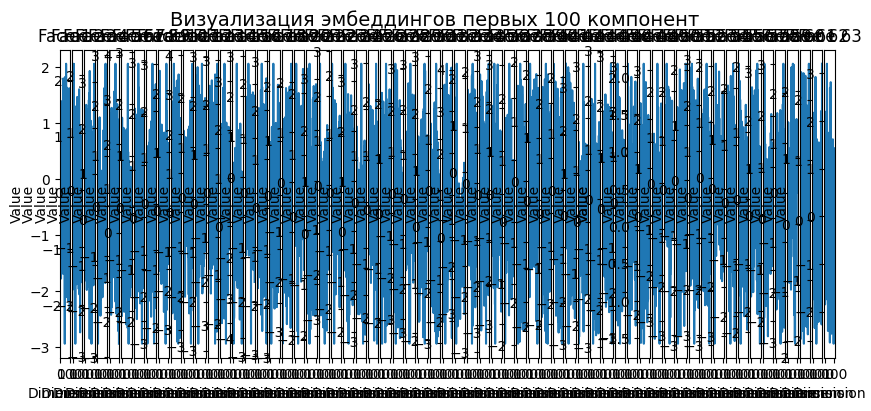

In [29]:
print("🔬 Извлекаем эмбеддинги из найденных лиц...")

# InsightFace уже содержит эмбеддинги в объектах face
test_img_path = 'test_images/group1.jpg'
test_img = cv2.imread(test_img_path)
test_faces = insightface_app.get(test_img)

print(f"✅ Найдено {len(test_faces)} лиц")
print(f"📏 Размерность эмбеддинга: {test_faces[0].embedding.shape}")

# Визуализация эмбеддингов
embeddings = [face.embedding for face in test_faces]
embeddings_array = np.array(embeddings)

plt.figure(figsize=(10, 4))
for i, emb in enumerate(embeddings_array):
    plt.subplot(1, len(embeddings_array), i+1)
    plt.plot(emb[:100])  # Первые 100 значений
    plt.title(f'Face {i+1}')
    plt.xlabel('Dimension')
    plt.ylabel('Value')
plt.suptitle('Визуализация эмбеддингов первых 100 компонент', fontsize=14)
plt.tight_layout()
plt.show()

In [27]:
embeddings_array.shape

(63, 512)

## 🎯 Итоги: Сравнение методов

| Метод | Скорость | Точность | Зависимости | Лучше всего для |
|-------|----------|----------|-------------|----------------|
| **HAAR-cascade** | ⭐⭐⭐ | ⭐⭐ | Только OpenCV | Реальное время, слабое железо |
| **MTCNN** | ⭐⭐ | ⭐⭐⭐⭐ | PyTorch | Баланс для обучения |
| **InsightFace** | ⭐⭐ | ⭐⭐⭐⭐⭐ | ONNX, PyTorch | Максимальная точность |

### 💡 Рекомендации:

**Для интенсива:**
- Используйте **MTCNN** для базового детектирования (проще в интеграции с PyTorch)
- Используйте **InsightFace** для финального проекта (лучшее качество)
- Избегайте **HAAR** для серьезных задач

**Для продакшена:**
- **InsightFace** - лучший выбор, если есть GPU
- **MTCNN** - хороший компромисс для CPU/GPU

## 📚 Домашнее задание

1. **Создайте** папку `my_faces` и положите туда 5-10 своих фото
2. **Запустите** все 3 метода на своих фото
3. **Сравните** результаты: какой метод лучше находит ваше лицо?
4. **Извлеките** эмбеддинги с помощью InsightFace
5. **Сохраните** их в файл `my_embeddings.npy`